In [1]:
# Importing librarues

import pandas as pd
import numpy as np

import seaborn as sn
import matplotlib.pyplot as plt

import nltk
import re

In [2]:
# Importing the data set
job=pd.read_csv("C:\\Users\\tavleen kaur\\Desktop\\0b. Assignments & Case Studies\\Projects\\Online Job Posting\\data job posts.csv")

In [3]:
job.head()

,jobpost,date,Title,Company,AnnouncementCode,Term,Eligibility,Audience,StartDate,Duration,...,Salary,ApplicationP,OpeningDate,Deadline,Notes,AboutC,Attach,Year,Month,IT
0,AMERIA Investment Consulting Company\nJOB TITL...,"Jan 5, 2004",Chief Financial Officer,AMERIA Investment Consulting Company,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"To apply for this position, please submit a\nc...",NaN,26 January 2004,NaN,NaN,NaN,2004,1,False
1,International Research & Exchanges Board (IREX...,"Jan 7, 2004",Full-time Community Connections Intern (paid i...,International Research & Exchanges Board (IREX),NaN,NaN,NaN,NaN,NaN,3 months,...,NaN,Please submit a cover letter and resume to:\nI...,NaN,12 January 2004,NaN,The International Research & Exchanges Board (...,NaN,2004,1,False
2,Caucasus Environmental NGO Network (CENN)\nJOB...,"Jan 7, 2004",Country Coordinator,Caucasus Environmental NGO Network (CENN),NaN,NaN,NaN,NaN,NaN,Renewable annual contract\nPOSITION,...,NaN,Please send resume or CV toursula.kazarian@......,NaN,20 January 2004\nSTART DATE: February 2004,NaN,The Caucasus Environmental NGO Network is a\nn...,NaN,2004,1,False
3,Manoff Group\nJOB TITLE: BCC Specialist\nPOSI...,"Jan 7, 2004",BCC Specialist,Manoff Group,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Please send cover letter and resume to Amy\nPe...,NaN,23 January 2004\nSTART DATE: Immediate,NaN,NaN,NaN,2004,1,False
4,Yerevan Brandy Company\nJOB TITLE: Software D...,"Jan 10, 2004",Software Developer,Yerevan Brandy Company,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Successful candidates should submit\n- CV; \n-...,NaN,"20 January 2004, 18:00",NaN,NaN,NaN,2004,1,True


In [4]:
job.shape

(19001, 24)

In [5]:
job.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19001 entries, 0 to 19000
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   jobpost           19001 non-null  object
 1   date              19001 non-null  object
 2   Title             18973 non-null  object
 3   Company           18994 non-null  object
 4   AnnouncementCode  1208 non-null   object
 5   Term              7676 non-null   object
 6   Eligibility       4930 non-null   object
 7   Audience          640 non-null    object
 8   StartDate         9675 non-null   object
 9   Duration          10798 non-null  object
 10  Location          18969 non-null  object
 11  JobDescription    15109 non-null  object
 12  JobRequirment     16479 non-null  object
 13  RequiredQual      18517 non-null  object
 14  Salary            9622 non-null   object
 15  ApplicationP      18941 non-null  object
 16  OpeningDate       18295 non-null  object
 17  Deadline    

In [6]:
job.columns

Index(['jobpost', 'date', 'Title', 'Company', 'AnnouncementCode', 'Term',
       'Eligibility', 'Audience', 'StartDate', 'Duration', 'Location',
       'JobDescription', 'JobRequirment', 'RequiredQual', 'Salary',
       'ApplicationP', 'OpeningDate', 'Deadline', 'Notes', 'AboutC', 'Attach',
       'Year', 'Month', 'IT'],
      dtype='object')

In [7]:
job.describe().T # numerical data

,count,mean,std,min,25%,50%,75%,max
Year,19001.0,2010.274722,3.315609,2004.0,2008.0,2011.0,2013.0,2015.0
Month,19001.0,6.493869,3.405503,1.0,3.0,7.0,9.0,12.0


In [8]:
# categorical data set
job.describe(include='object').T

,count,unique,top,freq
jobpost,19001,18892,Career Center NGO\nTITLE: English Language Co...,11
date,19001,4391,"May 6, 2014",24
Title,18973,8636,Accountant,328
Company,18994,4554,ArmenTel CJSC,353
AnnouncementCode,1208,1014,IOS - 001,9
Term,7676,411,Full time,5348
Eligibility,4930,663,All qualified candidates,1223
Audience,640,216,All interested candidates,105
StartDate,9675,1186,ASAP,4754
Duration,10798,1515,Long term,3458


In [9]:
import pandas_profiling as pp
pp.ProfileReport(job)

In [10]:
## Objective 1: Job Nature and Company Profiles
## The type of jobs that are in demand in Armenia? How are job natures changing over time.

job_new=job[['Title','JobDescription']]
job_new.isnull().sum()

Title               28
JobDescription    3892
dtype: int64

In [11]:
job_new.head()

,Title,JobDescription
0,Chief Financial Officer,AMERIA Investment Consulting Company is seekin...
1,Full-time Community Connections Intern (paid i...,NaN
2,Country Coordinator,Public outreach and strengthening of a growing...
3,BCC Specialist,The LEAD (Local Enhancement and Development fo...
4,Software Developer,NaN


In [12]:
# Missing Imputation

def missing_imputation(x):
    x=x.fillna("")
    return x

job_new2=job_new.apply(missing_imputation)
job_new2.head()

,Title,JobDescription
0,Chief Financial Officer,AMERIA Investment Consulting Company is seekin...
1,Full-time Community Connections Intern (paid i...,
2,Country Coordinator,Public outreach and strengthening of a growing...
3,BCC Specialist,The LEAD (Local Enhancement and Development fo...
4,Software Developer,


In [13]:
job_new2.isnull().sum()

Title             0
JobDescription    0
dtype: int64

In [14]:
## Now, concatenating the Title and JobDescription
job_new2=job_new2['Title']+' '+job_new2['JobDescription']

In [15]:
job_new2.head(20)

0     Chief Financial Officer AMERIA Investment Cons...
1     Full-time Community Connections Intern (paid i...
2     Country Coordinator Public outreach and streng...
3     BCC Specialist The LEAD (Local Enhancement and...
4                                   Software Developer 
5     Saleswoman Saleswoman will sell menswear and a...
6     Chief Accountant/ Finance Assistant The Armeni...
7       Non-paid part or full time Programmatic Intern 
8                       Assistant to Managing Director 
9     Program Assistant (INL), FSN-8; FP-6* The incu...
10              Short-Term Travel Grants (STG) Program 
11    Non-paid part or full time Administrative Intern 
12    Chief of Party (COP) ISC seeks an experienced ...
13    Community Development, Capacity Building and C...
14                                     General Manager 
15                               Network Administrator 
16                     Utopian World Championship 2004 
17    Country Economist (NOB) The United Nations

## DATA PROCESSING

In [16]:
## Creating corpus

corpus=[]
for i in range(0, len(job_new2)):
    job_clean=re.sub(r'\W+', ' ', str(job_new2[i])) # '\W+': only non-words
    job_clean=job_clean.lower()
    job_clean= re.sub(r'^br$', ' ', job_clean)
    job_clean = re.sub(r'\s+[a-z]\s+', ' ',job_clean)
    job_clean= re.sub(r'^[a-z]\s+', '', job_clean)
    job_clean=re.sub(r'[0-9]',' ',job_clean)
    job_clean = re.sub(r'\s+', ' ', job_clean)
    corpus.append(job_clean)

In [17]:
## Removing stopwords
from nltk.corpus import stopwords
nltk.download('stopwords')
stop = stopwords.words('english')

for i in range(0, len(corpus)):
    words=nltk.word_tokenize(corpus[i])
    words=[word for word in words if word not in stop]
    corpus[i]=' '.join(words)

[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [18]:
## Lemmatization

import nltk
wn=nltk.stem.WordNetLemmatizer()

for i in range(0, len(corpus)):
    words=nltk.word_tokenize(corpus[i])
    lemma=[wn.lemmatize(word) for word in words]
    corpus[i]=' '.join(lemma)

In [19]:
corpus[0]

'chief financial officer ameria investment consulting company seeking chief financial officer position manages company fiscal administrative function provides highly responsible technically complex staff assistance executive director work performed requires high level technical proficiency financial management investment management well management supervisory administrative skill'

In [20]:
corpus_new=pd.DataFrame(corpus)
corpus_new

,0
0,chief financial officer ameria investment cons...
1,full time community connection intern paid int...
2,country coordinator public outreach strengthen...
3,bcc specialist lead local enhancement developm...
4,software developer
...,...
18996,senior creative ux ui designer tech startup te...
18997,category development manager
18998,operational marketing manager
18999,head online sale department san lazzaro llc lo...


In [21]:
## Now concatenating the date variable with corpus_new
df=pd.concat([job.date, pd.DataFrame(corpus)], axis=1)
df.columns=['date','corpus_new']
df.dtypes

date          object
corpus_new    object
dtype: object

In [22]:
# converting the data type of date variable
df['date']=pd.to_datetime(df['date'], errors='coerce')
df.dtypes

date          datetime64[ns]
corpus_new            object
dtype: object

In [23]:
df=df.set_index('date') ## setting the index as date

In [24]:
df.head()

,corpus_new
date,
2004-01-05,chief financial officer ameria investment cons...
2004-01-07,full time community connection intern paid int...
2004-01-07,country coordinator public outreach strengthen...
2004-01-07,bcc specialist lead local enhancement developm...
2004-01-10,software developer


In [25]:
df.index.year.value_counts()

2012.0    1965
2013.0    1834
2014.0    1811
2008.0    1599
2011.0    1567
2007.0    1383
2010.0    1381
2015.0    1194
2009.0    1091
2005.0    1044
2006.0    1032
2004.0     803
Name: date, dtype: int64

### We will divide the years into group of 3 to see how the job demands are changing over the years by building WordCould

In [26]:
## Jobs in the year 2004-2007
set1=df['2004':'2007']
set1.head()

,corpus_new
date,
2004-01-05,chief financial officer ameria investment cons...
2004-01-07,full time community connection intern paid int...
2004-01-07,country coordinator public outreach strengthen...
2004-01-07,bcc specialist lead local enhancement developm...
2004-01-10,software developer


In [27]:
cloud1=' '.join(set1['corpus_new'])

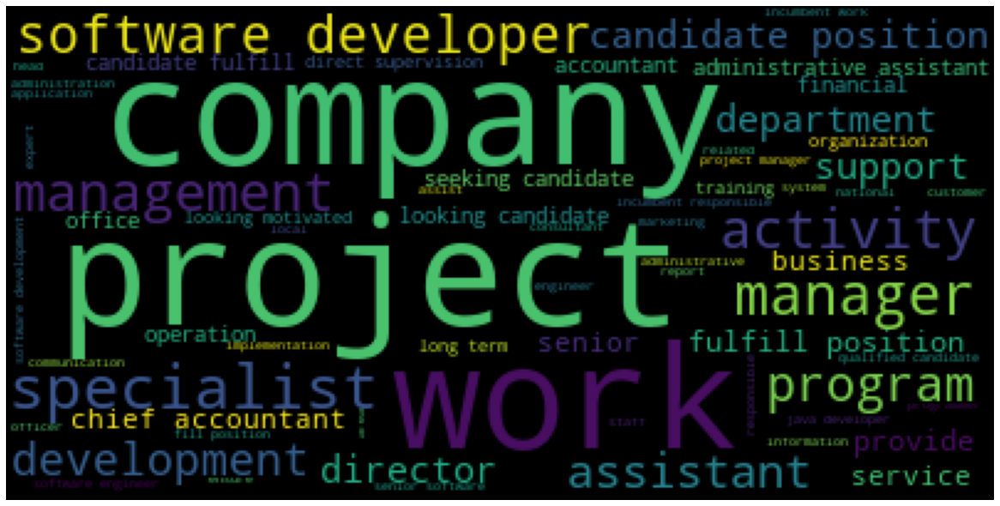

In [28]:
from wordcloud import WordCloud
wordcloud=WordCloud(max_font_size=60).generate(cloud1)
plt.figure(figsize=(16,12))
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)

#### Now we will remove not so required words reflecting in the wordcloud, hence refining the result(which are not upto our objective)

In [29]:
for word in ['work','company','project','management','activity','department','development','fulfill position','candidate position',
             'senior','looking motivated','qualified candidate','looking candidate','provide','office','program',
             'support','responsible','staff','operation','incumbent','organization','implementation','information','business',
             'report','financial assist']:
    
    cloud1=cloud1.replace(word,'')
    

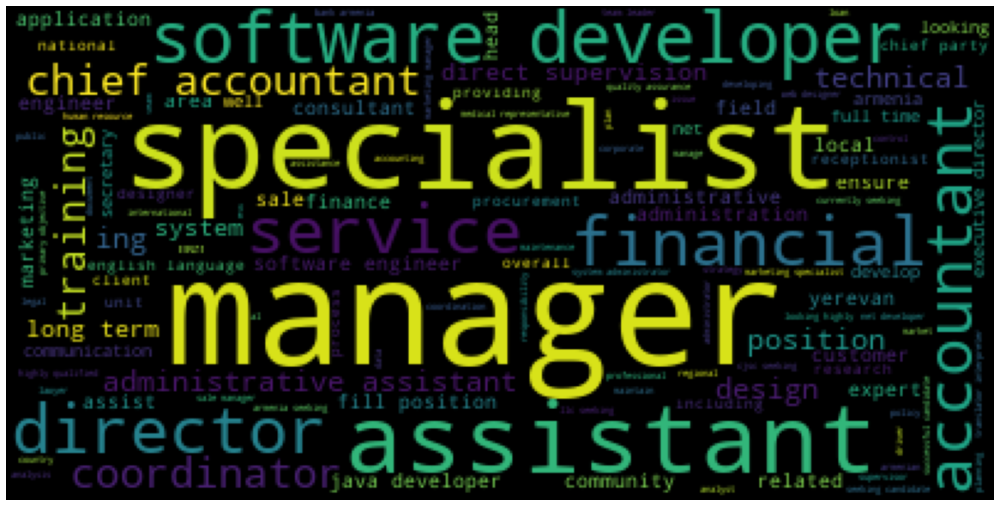

In [30]:
wordcloud=WordCloud(max_font_size=60).generate(cloud1)
plt.figure(figsize=(16,12))
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)

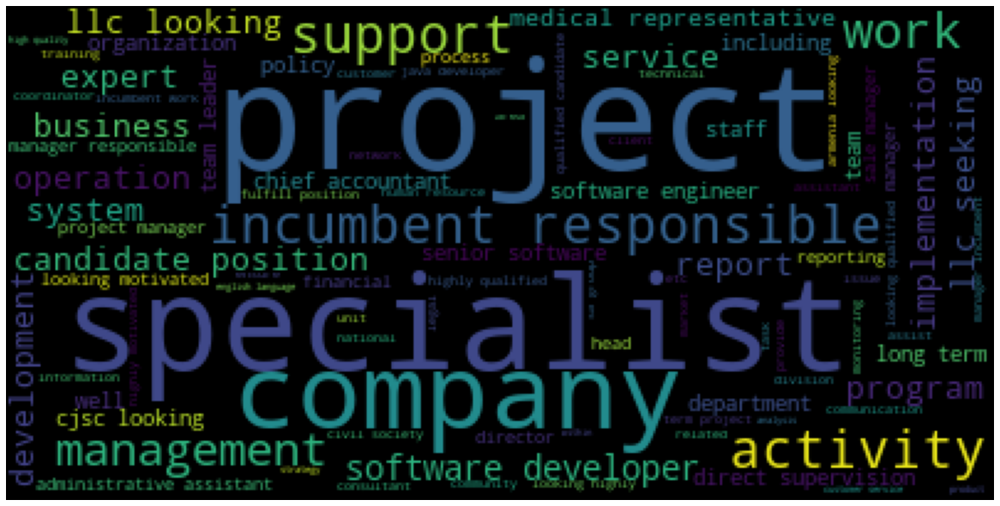

In [31]:
## Jobs in the year 2008 to 2011.
set2=df['2008':'2011']
cloud2=' '.join(set2['corpus_new'])

wordcloud=WordCloud(max_font_size=60).generate(cloud2)

plt.figure(figsize=(16,12))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)

In [32]:
## Now again removing the unnescessay word

for word in ['report','program','community','staff','work','department','including', 'information','related','implementation',
             'support','cjsc looking','llc', 'looking','qualified', 'candidate','team','divison','policy','position',
              'activity','service','organization','responsible','communication','specialist','project','incumbent','company']:
    
    cloud2=cloud2.replace(word,'')

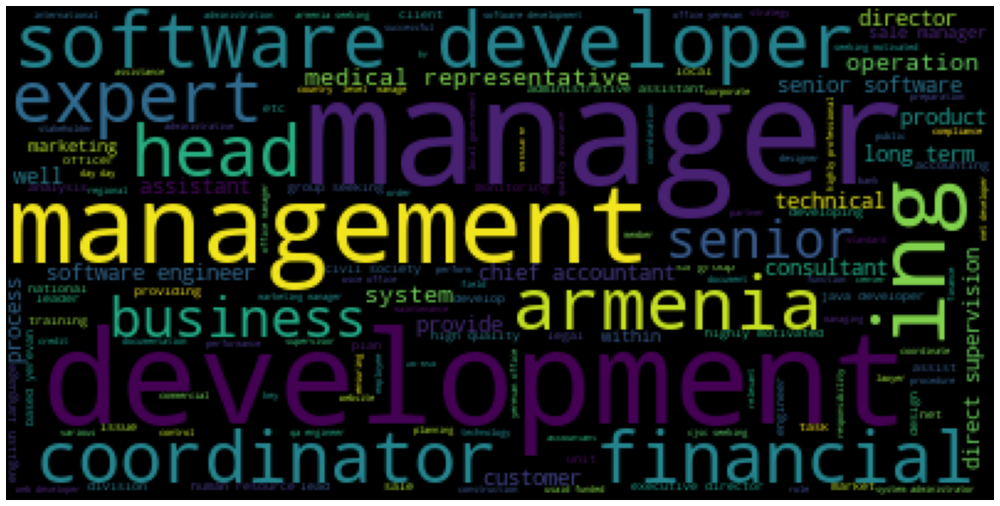

In [33]:
wordcloud=WordCloud(max_font_size=60).generate(cloud2)

plt.figure(figsize=(16,12))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)

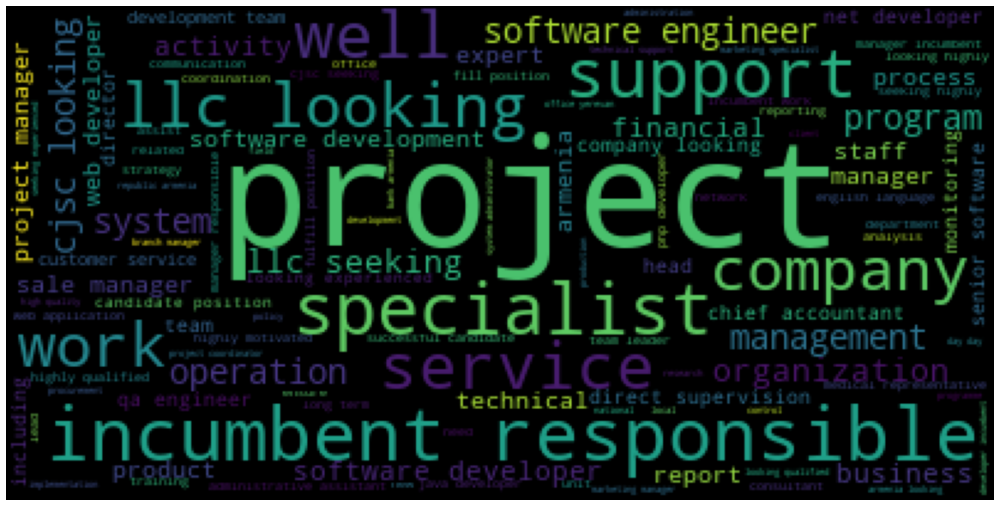

In [34]:
## Jobs in the year 2012:2015
set3=df['2012':'2015']
cloud3=' '.join(set3['corpus_new'])

wordcloud=WordCloud(max_font_size=60).generate(cloud3)
plt.figure(figsize=(16,12))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)

In [130]:
for word in['organization','product','system','program','cjsc looking','management','manager','incumbent','support','report',
            'seeking','service','well','company','looking','work','including','staff','activity','responsible',
            'candidate', 'position','operation','fill', 'position','long', 'term','armenia','llc','looking','related sale']:
    cloud3=cloud3.replace(word,'')

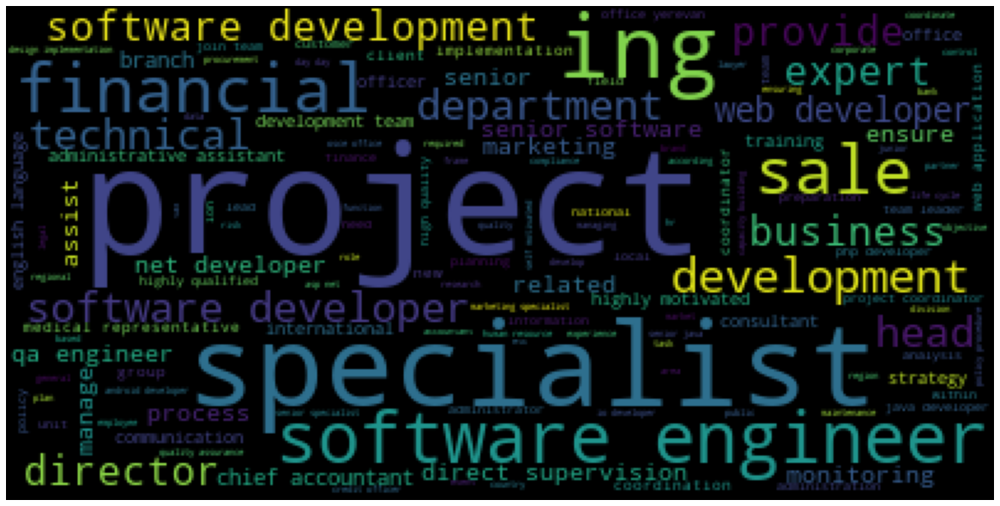

In [36]:
wordcloud=WordCloud(max_font_size=60).generate(cloud3)
plt.figure(figsize=(16,12))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)

## Objective 2: Desired Characteristics and Skill-sets:

In [37]:
job2=job[['JobDescription','RequiredQual']]

## Missing Imputation
def missing_imputation(x):
    x=x.fillna(' ')
    return x

job2=job2.apply(missing_imputation)

In [38]:
job2.isnull().sum()

JobDescription    0
RequiredQual      0
dtype: int64

In [39]:
df2=job2['JobDescription']+' '+ job2['RequiredQual']

In [40]:
## DATA PROCESSING
corpus2=[]
for i in range(0, len(df2)):
    job_clean2=re.sub(r'\W', ' ' ,str(df2[i]))
    job_clean2=job_clean2.lower()
    job_clean2=re.sub(r'^br$',' ',job_clean2)
    job_clean2=re.sub(r'\s+[a-z]\s+',' ',job_clean2)
    job_clean2=re.sub(r'^[a-z]\s+','',job_clean2)
    job_clean2=re.sub(r'[0-9]',' ',job_clean2)
    job_clean2=re.sub(r'\s+',' ',job_clean2)
    corpus2.append(job_clean2)

In [41]:
## Removing stopwords
for i in range(0, len(corpus2)):
    words=nltk.word_tokenize(corpus2[i])
    words=[word for word in words if word not in stop]
    corpus2[i]=' '.join(words)

In [42]:
# Lemmatization
for i in range(0, len(corpus2[i])):
    words=nltk.word_tokenize(corpus2[i])
    words=[wn.lemmatize(word) for word in words]
    corpus2[i]=' '.join(words)

In [43]:
corpus2[1]

'bachelor degree master preferred excellent skill spoken written english armenian language past english armenian translation armenian english translation experience good communication public speaking skill ability work independently part team remuneration commensurate experience'

In [44]:
# Now concatenating the time variable with corpus created above
C2=pd.concat([job.date, pd.DataFrame(corpus2)], axis=1)
C2.columns=['date','corpus2']

In [45]:
## Now converting the date variable into datetime
C2['date']=pd.to_datetime(C2['date'], errors='coerce')
C2.dtypes

date       datetime64[ns]
corpus2            object
dtype: object

In [46]:
C2=C2.set_index('date')

In [47]:
C2.index.year.value_counts()

2012.0    1965
2013.0    1834
2014.0    1811
2008.0    1599
2011.0    1567
2007.0    1383
2010.0    1381
2015.0    1194
2009.0    1091
2005.0    1044
2006.0    1032
2004.0     803
Name: date, dtype: int64

#### Now we will divide the years above into 3 quarters to see the change in demand

In [48]:
d1=C2['2004':'2007']
d1.head()

,corpus2
date,
2004-01-05,ameria investment consulting company seeking c...
2004-01-07,bachelor degree master preferred excellent ski...
2004-01-07,public outreach strengthening growing network ...
2004-01-07,lead local enhancement development health bcc ...
2004-01-10,university degree economical background plus e...


In [131]:
cloud4=' '.join(d1['corpus2'])
cloud4

'ameria investment consulting company seeking chief financial officer position manages company fiscal administrative function provides highly responsible technically complex staff assistance executive director work performed requires high level technical proficiency financial management investment management well management supervisory administrative skill perform job successfully individual must able perform essential duty satisfactorily requirement listed representative knowledge skill ability required knowledge generally accepted accounting principle local accounting standard legislation state reporting requirement pertaining accounting principle practice financial management budgeting principle practice financial system design analysis principle practice contract management record management risk management principle practice management supervision principle practice information system management ability apply sound fiscal administrative practice company activity plan organize supe

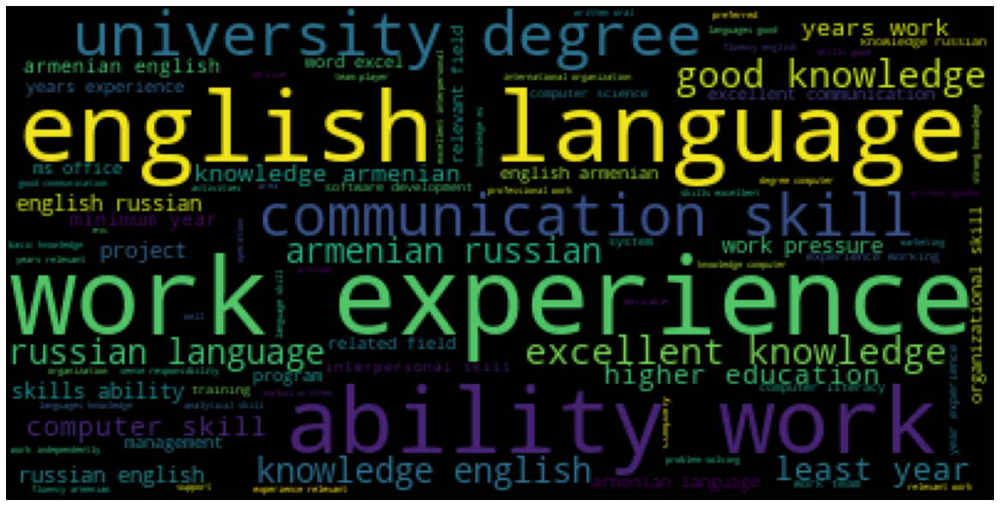

In [50]:
wordcloud=WordCloud(max_font_size=60).generate(cloud4)
plt.figure(figsize=(16,12))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)

In [51]:
for word in ['work','experience','knowledge','relevant','ability','good','excellent knowledge','least year',
              'skills','skills ability','work pressure','relevant field','work experience','ability work','least','year']:
    cloud4=cloud4.replace(word,' ')

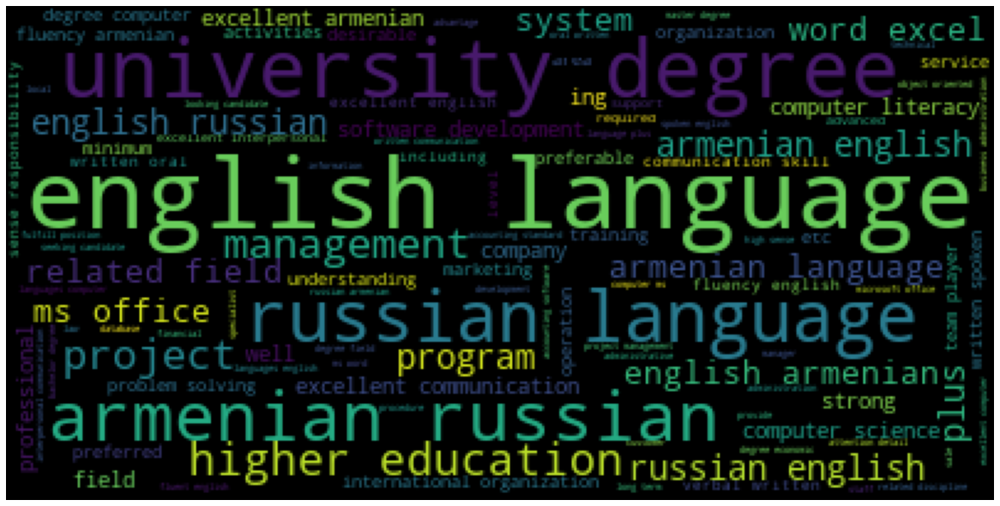

In [52]:
wordcloud=WordCloud(max_font_size=60).generate(cloud4)
plt.figure(figsize=(16,12))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)

In [53]:
d2=C2['2008':'2011']
d2.head()

,corpus2
date,
2008-01-07,
2008-01-07,higher education preferably marketing excellen...
2008-01-08,primary objective position produce required pr...
2008-01-07,firmplace corporation looking innovative graph...
2008-01-07,varnita ltd seeking scm engineer maintain deve...


In [54]:
cloud5=' '.join(d2['corpus2'])

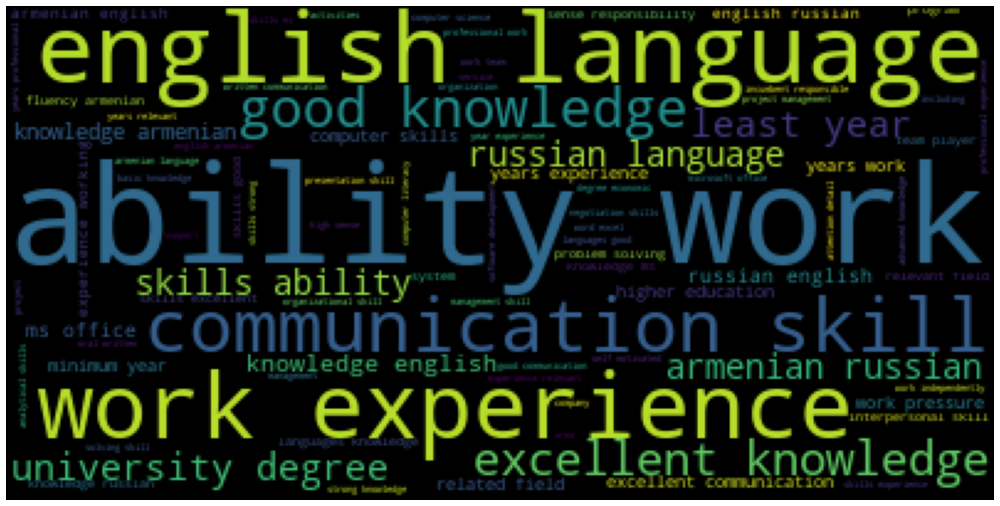

In [55]:
wordcloud=WordCloud(max_font_size=60).generate(cloud5)
plt.figure(figsize=(16,12))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)

In [56]:
X= ['skills ability','skills','ability','good knowledge','good','knowledge','ability work','work experience',
             'excellent knowledge','least year','work pressure','relevant field']
for i in X:
    cloud5=cloud5.replace(i," ")

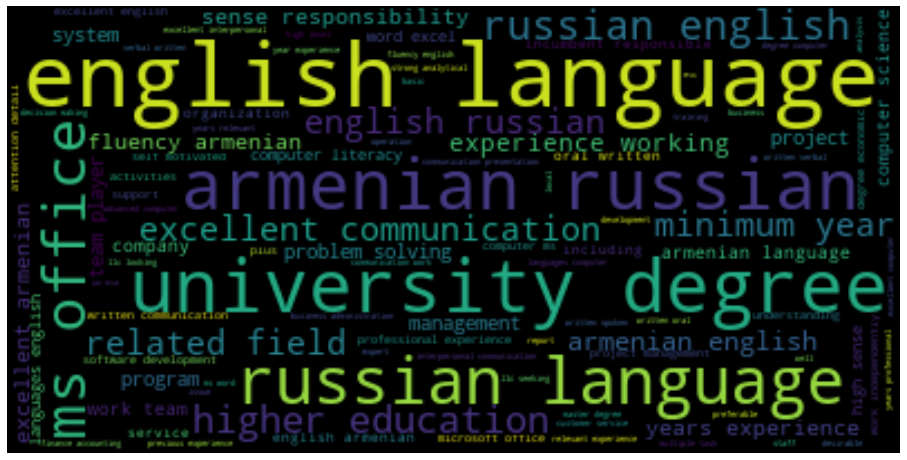

In [57]:
wordcloud = WordCloud(max_font_size=60).generate(cloud5)
plt.figure(figsize=(16,12))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [58]:
d3=C2['2012':'2015']
d3.head()

,corpus2
date,
2012-01-09,university degree social science business admi...
2012-01-09,haypost cjsc seeking project managers operatio...
2012-01-09,university degree accounting finance economics...
2012-01-09,sas group llc seeking legal assistant carry en...
2012-01-09,sales department manager involved coordination...


In [59]:
cloud6=' '.join(d3['corpus2'])

In [60]:
cloud6

'university degree social science business administration related field least years relevant professional experience least years within international organisation good familiarity situation refugees armenia fluency armenian good knowledge english language good drafting skills english excellent interpersonal communication coordination skills haypost cjsc seeking project managers operations department depth understanding strategic sourcing supplier management responsible implementing logistics transport organization delivery strategies procedures according la poste business procedures requirements university degree mba plus least years work experience relevant field good analytical organizational skills excellent communication time management organizational skills attention details excellent knowledge russian english languages ability manage multiple tasks simultaneously excellent knowledge ms office internet university degree accounting finance economics ra auditor license mba cpa acca 

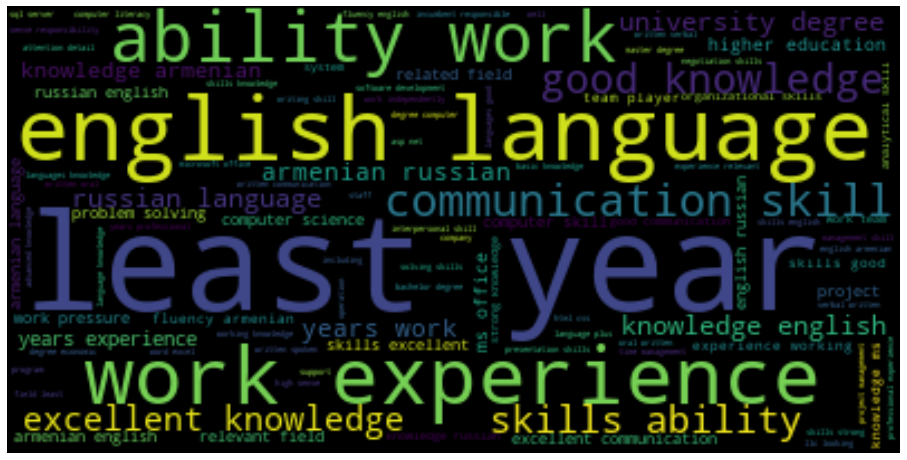

In [61]:
wordcloud = WordCloud(max_font_size=60).generate(cloud6)
plt.figure(figsize=(16,12))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [62]:
for word in ['ability work','ability','work','skills','skills ability','least year','excellent knowledge',
             'armenian','relevant field','good knowledge','russian','related field','english language','work experience',
             'years work','least','year']:
    cloud6=cloud6.replace(word,' ')

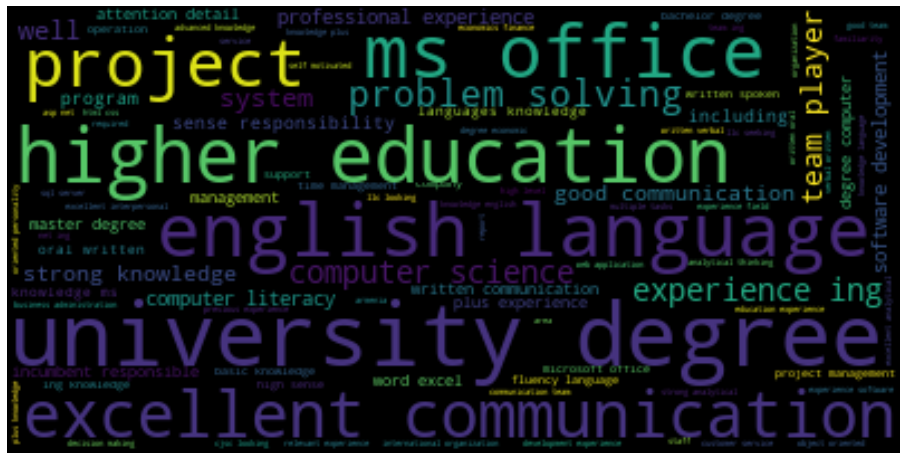

In [63]:
wordcloud = WordCloud(max_font_size=60).generate(cloud6)
plt.figure(figsize=(16,12))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## IT JOB CLASSIFICATION

In [64]:
## Build a classifier that can tell us from job description and company description whether a job is IT or not.

df3=job[['Title','Company','JobDescription','JobRequirment','RequiredQual']]
df3.head(2)

,Title,Company,JobDescription,JobRequirment,RequiredQual
0,Chief Financial Officer,AMERIA Investment Consulting Company,AMERIA Investment Consulting Company is seekin...,- Supervises financial management and administ...,"To perform this job successfully, an\nindividu..."
1,Full-time Community Connections Intern (paid i...,International Research & Exchanges Board (IREX),NaN,NaN,- Bachelor's Degree; Master's is preferred;\n-...


In [65]:
df3.isnull().sum()

Title               28
Company              7
JobDescription    3892
JobRequirment     2522
RequiredQual       484
dtype: int64

In [66]:
## Missing Imputation
def missing_imputation(x):
    x=x.fillna(' ')
    return x

df3=df3.apply(missing_imputation)

In [67]:
df3.isnull().sum()

Title             0
Company           0
JobDescription    0
JobRequirment     0
RequiredQual      0
dtype: int64

In [68]:
## Now, concatenating all the columns
X=df3['Company']+ ' '+ df3['Title']+ ' '+ df3['JobDescription']+ ' '+ df3['JobRequirment']+' '+ df3['RequiredQual']

In [69]:
X.shape

(19001,)

In [70]:
X[1]

"International Research & Exchanges Board (IREX) Full-time Community Connections Intern (paid internship)     - Bachelor's Degree; Master's is preferred;\n- Excellent skills in spoken and written English and Armenian languages;\n- Past English to Armenian translation and Armenian to English\ntranslation experience;\n- Good communication and public speaking skills;\n- Ability to work independently and as part of a team.\nREMUNERATION:  Commensurate with experience."

In [71]:
y=job['IT']
y.shape

(19001,)

In [72]:
y=job['IT'].map({True:1, False:0})

In [73]:
## Now, Data processing of X variable
# Creating the corpus

corpus_IT = []
for i in range(0, len(X)):
    job_cleanIT= re.sub(r'\W', ' ', str(X[i])) #removing all special symbols except ' _ '
    job_cleanIT= job_cleanIT.lower()
    job_cleanIT= re.sub(r'^br$', ' ', job_cleanIT) 
    job_cleanIT= re.sub(r'\s+[a-z]\s+', ' ',job_cleanIT)
    job_cleanIT= re.sub(r'^[a-z]\s+', '', job_cleanIT)
    job_cleanIT=re.sub(r'[0-9]',' ',job_cleanIT)
    
    job_cleanIT= re.sub(r'\s+', ' ', job_cleanIT) #Removing extra spaces between words
    corpus_IT.append(job_cleanIT) 

In [74]:
## Removing stopwords
from nltk.corpus import stopwords
for i in range(len(corpus_IT)):
    words = nltk.word_tokenize(corpus_IT[i])
    words = [word for word in words if word not in stop]
    corpus_IT[i] = ' '.join(words) 

In [75]:
# Lemmatisation
for i in range(0, len(corpus2[i])):
    words=nltk.word_tokenize(corpus2[i])
    words=[wn.lemmatize(word) for word in words]
    corpus2[i]=' '.join(words)

In [76]:
## Creating the TF-IDF MODEL
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer=TfidfVectorizer(max_features=2000)
X=vectorizer.fit_transform(corpus_IT).toarray()

In [77]:
X.shape

(19001, 2000)

In [78]:
y.shape

(19001,)

In [79]:
## Now splitting the data set into training and testing
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y, test_size=0.2, random_state=42)

## Applying supervised models to classify whether job is IT or not

## 1.Naive Bayes

In [80]:
from sklearn.naive_bayes import MultinomialNB 

In [81]:
nb=MultinomialNB()

In [82]:
nb.fit(X_train,y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [83]:
y_pred=nb.predict(X_test)

In [84]:
from sklearn import metrics

## Accuracy of testing data
print(metrics.accuracy_score(y_test, y_pred))

0.9131807419100236


In [85]:
## Accuracy of training data
print(metrics.accuracy_score(y_train, nb.predict(X_train)))

0.9160526315789473


#### We can see that model has good accuracy

In [86]:
model=pd.DataFrame({'Actua':y_test,'Predicted':y_pred})
model.head()

,Actua,Predicted
13813,0,0
4097,0,0
12527,1,1
16950,0,0
12544,1,1


In [87]:
## Confusion matrix
cm=metrics.confusion_matrix(y_test,y_pred)
cm

array([[2832,  211],
       [ 119,  639]], dtype=int64)

In [88]:
#Predicted the probablities
y_pred_prob = nb.predict_proba(X_test)[:,1]
y_pred_prob

array([1.45770144e-03, 3.40065372e-01, 9.99782663e-01, ...,
       1.27589586e-03, 4.03909205e-03, 9.11405100e-04])

In [89]:
## ROC AUC SCORE
metrics.roc_auc_score(y_test,y_pred_prob)

0.9531131183034379

## 2,Logistic Regression

In [90]:
from sklearn.linear_model import LogisticRegression

In [91]:
lr=LogisticRegression()

In [92]:
lr.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [93]:
y_pred=lr.predict(X_test)

In [94]:
## Accuracy of test data
print(metrics.accuracy_score(y_test, y_pred))

0.9400157853196527


In [95]:
## Accuracy of training data
print(metrics.accuracy_score(y_train, lr.predict(X_train)))

0.9498684210526316


In [96]:
## Dataframe of actual and predicted test data
model2=pd.DataFrame({'Actual':y_test,'Predicted':y_pred})
model2.head()

,Actual,Predicted
13813,0,0
4097,0,0
12527,1,1
16950,0,0
12544,1,1


In [97]:
## Confusion Matrix
cm2=metrics.confusion_matrix(y_test,y_pred)
cm2

array([[2973,   70],
       [ 158,  600]], dtype=int64)

In [98]:
## Predict probablities
y_pred_prob=lr.predict_proba(X_test)[:,1]
y_pred_prob

array([0.00579257, 0.2185296 , 0.84498538, ..., 0.08383187, 0.0080451 ,
       0.01146514])

In [99]:
## ROC AUC SCORE
print(metrics.roc_auc_score(y_test,y_pred_prob))

0.9795664083059263


### Objective 4: Similarity of Jobs

In [100]:
## Given a job title find 5 top jobs that are of similar nature, based on job post

In [101]:
df5=job['Title']

## DATA PROCESSING

In [102]:
corpus_sim= []
for i in range(0, len(df5)):
    job_sim = re.sub(r'\W', ' ', str(df5[i])) #removing all special symbols except ' _ '
    job_sim = job_sim.lower()
    job_sim = re.sub(r'^br$', ' ', job_sim) 
    job_sim = re.sub(r'\s+[a-z]\s+', ' ',job_sim)
    job_sim = re.sub(r'^[a-z]\s+', '', job_sim )
    job_sim =re.sub(r'[0-9]',' ',job_sim)
    
    job_sim = re.sub(r'\s+', ' ', job_sim) #Removing extra spaces between words
    corpus_sim.append(job_sim) 

In [103]:
## Removing stopwords

for i in range(len(corpus_sim)):
    words = nltk.word_tokenize(corpus_sim[i])
    words = [word for word in words if word not in stop]
    corpus_sim[i] = ' '.join(words)        

In [104]:
# Creating the Tf-Idf Model

vectorizer = TfidfVectorizer(max_features = 2000)
X = vectorizer.fit_transform(corpus_sim).toarray()


In [105]:
X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [106]:
X.shape

(19001, 2000)

In [112]:
from sklearn.neighbors import NearestNeighbors

In [110]:
#Let us take a job title for which we have to obtain simmilar jobs or neighbors

job_title=['cheif accountant']

Y=vectorizer.transform(job_title).toarray()

In [111]:
Y

array([[0., 0., 0., ..., 0., 0., 0.]])

In [125]:
## showing 5 similar jobs 
neigh= NearestNeighbors(n_neighbors=5, n_jobs=-1)
neigh.fit(X)

NearestNeighbors(algorithm='auto', leaf_size=30, metric='minkowski',
                 metric_params=None, n_jobs=-1, n_neighbors=5, p=2, radius=1.0)

In [126]:
## These are 5 similar jobs matching our given job-title.They are TF-Idf values.
i,j=neigh.kneighbors(Y)
print(i)

[[0. 0. 0. 0. 0.]]


In [127]:
print(j)

[[ 6755 12674 15784   743  7236]]


In [128]:
### Converting into 2-D array

TWO_D= np.array([i,j])
TWO_D

array([[[    0.,     0.,     0.,     0.,     0.]],

       [[ 6755., 12674., 15784.,   743.,  7236.]]])

In [129]:
## inverse transforming the TF-IDF values to get the meanungful data
vectorizer.inverse_transform(TWO_D)

[array([], dtype='<U18'),
 array(['abovyan', 'academy', 'acca', 'access', 'account'], dtype='<U18')]